# Author: Nabil Ibtehaz (https://github.com/nibtehaz)


## Long signal model + UNet

In [1]:
from MAE1DCorrelated import MaskedAutoencoderViT1DCorrelated
from MAEBank import MAEBank
from refiner_unet import  UNet
from refiner_mresunet import MultiResUnet
import numpy as np
import torch
from torch import nn
from tqdm import tqdm
from typing import Callable, List, Optional, Tuple, Union
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from util.ecg_dataset import ECGPretrainDataset
import seaborn as sns

sns.set()

/home/nabil/ecg_repr/ecg_repr/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/home/nabil/ecg_repr/ecg_repr/lib/python3.9/site-packages/torchvision/image.so: undefined symbol: _ZN3c104impl8GPUTrace13gpuTraceStateE'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
mdl_bnk = MAEBank(['cpu'])

Model config
MaskedAutoencoderViT1D(sig_len=2500, window_len=100, in_chans=1,embed_dim=768, depth=12, num_heads=8,decoder_embed_dim=512, decoder_depth=8, decoder_num_heads=512,mlp_ratio=4.0, norm_layer=<class 'torch.nn.modules.normalization.LayerNorm'>, norm_pix_loss=True)
Initializing MAE 1
Initializing MAE 2
Initializing MAE 3
Initializing MAE 4
Initializing MAE 5
Initializing MAE 6
Initializing MAE 7
Initializing MAE 8
Initializing MAE 9
Initializing MAE 10
Initializing MAE 11
Initializing MAE 12


In [4]:
mdl_pth = 'experiments/expb3/'

In [5]:
for i in range(12):
    print(f'MAE {i+1} loaded')
    mdl_bnk.maes[i].load_state_dict(
        torch.load(
        f"{mdl_pth}saved_models/mae_channel_{i+1}_best.pth",
        map_location="cpu",
    )
)

MAE 1 loaded


MAE 2 loaded
MAE 3 loaded
MAE 4 loaded
MAE 5 loaded
MAE 6 loaded
MAE 7 loaded
MAE 8 loaded
MAE 9 loaded
MAE 10 loaded
MAE 11 loaded
MAE 12 loaded


In [7]:
unt1 = UNet(1)

unt1.load_state_dict(
        torch.load(
        f"{mdl_pth}saved_models/unet_channel_2.pth",
        map_location="cpu",
    )
)

<All keys matched successfully>

In [8]:
dataset_ecg = ECGPretrainDataset(
    "/data/nabil/ecg_repr/physionet.org/files/challenge-2021/1.0.3/training/",
    2500
)

CHANNEL_NAMES = [' ','I','II','III','aVR','aVL','aVF','V1','V2','V3','V4','V5','V6']

In [7]:
dataset_ecg.get_len(1110)

5000

In [13]:
sig = dataset_ecg.__getitem__(40, -1, -1)
dataset_ecg.__getitem__(40, -1, -1).shape

(12, 2500)

In [9]:
def compute_SNR(pred, gt):

    noise = pred - gt

    P_s = np.sum(np.dot(gt, gt))
    P_n = np.sum(np.dot(noise, noise))

    snr = 10 * np.log10(P_s/P_n)

    return snr


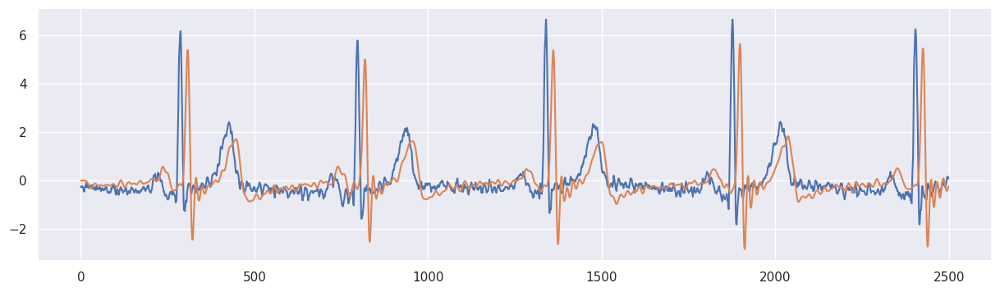

In [132]:
plt.figure(figsize=(15,4))
plt.plot(sgnl)
plt.plot(filtering(sgnl,500)[2:-2])

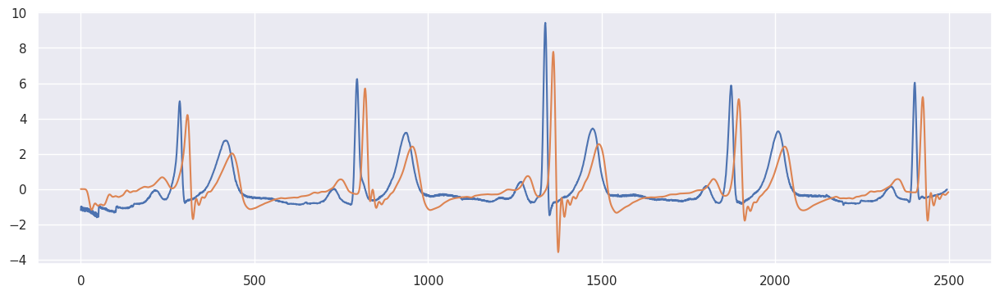

In [116]:

plt.figure(figsize=(15,4))
plt.plot(pred_refine_ensmeble)
plt.plot(filtering(pred_refine_ensmeble,500))

In [138]:
round(compute_SNR(filtering(pred_refine_ensmeble), filtering(sgnl[2:-2])),2)

5.82

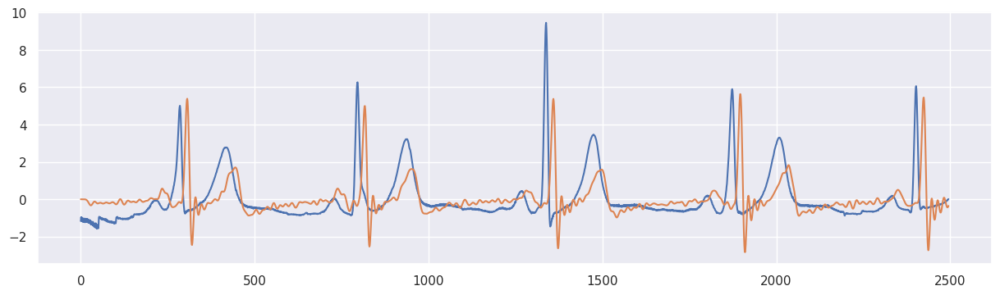

In [136]:
round(compute_SNR(filtering(pred_refine_ensmeble), filtering(sgnl[2:-2])),2)
plt.figure(figsize=(15,4))

plt.plot(pred_refine_ensmeble)
plt.plot(filtering(sgnl[2:-2])[2:-2])

In [126]:
filtering(sgnl[2:-2]).shape

(2504,)

In [10]:
def filtering(signal,Fs=500,step2='movingAverage',step2Param=5,highPassFc=1,lowPassFc=30,butterworthOrder=12):
	"""
	Filters and preprocesses the signal.
		
		1 ) Substract the mean
		2 ) Moving average for high order noises
		3 ) High pass filter for drift suppression
		4 ) Low pass filter for high frequency suppression

	As presented in 
						E.M. Abu Anas, S.Y. Lee, M.K. Hasan
						Exploiting correlation of ECG with certain emd functions for discrimination of ventricular fibrillation
						Comput. Biol. Med., 41 (2) (2011), pp. 110-114
	
	Arguments:
		signal {numpy array} -- signal
		Fs {int} -- sampling frequency
	
	Keyword Arguments:
		step2 {str} -- which mode of filtering is used ? 'movingAverage' or 'gaussianFilter' (default: {'movingAverage'})
		step2Param {int} -- window length (default: {5})
		highPassFc {int} -- cut-off freq for high pass filter (default: {1})
		lowPassFc {int} -- cut-off freq for low pass filter (default: {30})
		butterworthOrder {int} -- order of butter worth filter (default: {12})
	
	Returns:
		[{numpy array}] -- the filtered and processed signal
	"""

	from scipy.signal import butter, filtfilt, lfilter

	# 1 ) Substract the mean

	miu = np.mean(signal)		# mean of the signal

	signal -= miu 


	# 2 ) Moving average for high order noises

	if(step2=='movingAverage'):

		signal2 = np.convolve(signal,np.ones(step2Param)/(step2Param*1.0))		# equivalent to moving average


	elif(step2=='gaussianFilter'):

		# to be implemented later 
		pass 

	# 3 ) High pass filter for drift suppression

	Fnyq = 0.5*Fs			# nyquist frequency 

	b, a = butter(1, highPassFc/ Fnyq , btype='highpass')		# definition of the high pass filter
	signal3 = lfilter(b, a, signal2)

	# 4 ) Low pass filter for high frequency suppression

	b,a = butter(12,lowPassFc/Fnyq)								# definition of the high pass filter
	signal4 = lfilter(b, a, signal3)
	
	return signal4


In [58]:
a = np.array([1,2,3])
np.dot(a,a)

14

1 1


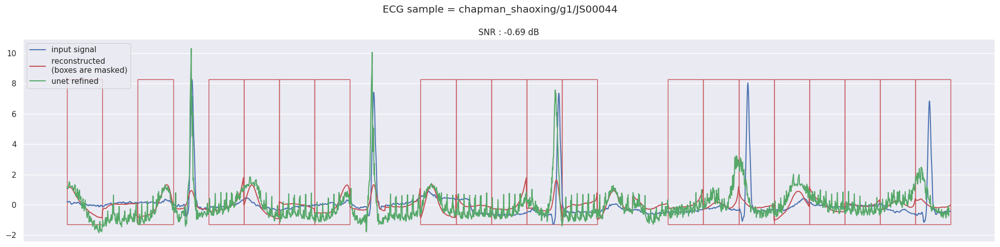

In [18]:
idx = 80000
#idx = 
#idx = 40
idx = 40
st_smpl = 1000
msk_ratio = 0.75

sig= dataset_ecg.__getitem__(idx, -1, st_smpl)
ids_shuffle, ids_restore, ids_keep = mdl_bnk.propose_masking(1, mdl_bnk.num_patches, msk_ratio)


core_chnl = 1

plt.figure(figsize=(20, 5), dpi=100)
#plt.figure(figsize=(30, 45), dpi=100)

x = torch.unsqueeze(torch.Tensor(sig[core_chnl-1:core_chnl,:]), dim=0)
latent1, mask = mdl_bnk.maes[core_chnl].forward_encoder(x, msk_ratio, ids_shuffle, ids_restore, ids_keep)
pred1 = mdl_bnk.maes[core_chnl-1].forward_decoder(latent1, ids_restore)
pred1 = mdl_bnk.maes[core_chnl-1].unpatchify(pred1).detach().numpy()


pred1_refine = unt1(torch.Tensor(pred1[:,:,2:-2]))
pred1_refine = pred1_refine.detach().numpy() * 10

mask = mask[0]
            

plt.plot(sig[(core_chnl-1):core_chnl,:].ravel(), label="input signal", c='b')
#plt.plot(gt.ravel(), label="ground truth", c='b')
plt.plot(pred1.ravel(), label="reconstructed \n(boxes are masked)", c='r')
plt.plot(pred1_refine.ravel(), label="unet refined", c='g')
ax = plt.gca()
for i2 in range(len(mask)):
    if mask[i2] == 1:
        rect = patches.Rectangle(
            (i2 * mdl_bnk.maes[core_chnl-1].window_len, min(np.min(pred1), torch.min(x).item())),
            mdl_bnk.maes[core_chnl-1].window_len,
            max(np.max(pred1), torch.max(x).item()) - min(np.min(pred1), torch.min(x).item()),
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        ax.add_patch(rect)
# plt.legend(loc=(1.00, 0.5))
ax.set_xticks([])

plt.suptitle(f'ECG sample = {dataset_ecg.ecg_data[idx][71:]}')
plt.title(f'SNR : {round(compute_SNR(pred1_refine.ravel(),sig[(core_chnl-1):core_chnl,:].ravel()[2:-2]),2)} dB')

plt.legend()

        
plt.tight_layout()

print(qc.get_signal_quality(sig[(core_chnl-1):core_chnl,:].ravel()),qc.get_signal_quality(pred1_refine.ravel()))

1 1


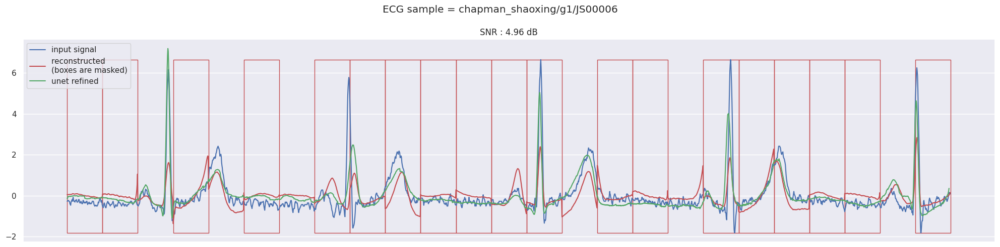

In [40]:
idx = 80000
#idx = 
#idx = 40
idx = 4
st_smpl = 1000
msk_ratio = 0.75

sig= dataset_ecg.__getitem__(idx, -1, st_smpl)
ids_shuffle, ids_restore, ids_keep = mdl_bnk.propose_masking(1, mdl_bnk.num_patches, msk_ratio)


core_chnl = 1

plt.figure(figsize=(20, 5), dpi=100)
#plt.figure(figsize=(30, 45), dpi=100)

x = torch.unsqueeze(torch.Tensor(sig[core_chnl-1:core_chnl,:]), dim=0)
latent1, mask = mdl_bnk.maes[core_chnl].forward_encoder(x, msk_ratio, ids_shuffle, ids_restore, ids_keep)
pred1 = mdl_bnk.maes[core_chnl-1].forward_decoder(latent1, ids_restore)
pred1 = mdl_bnk.maes[core_chnl-1].unpatchify(pred1).detach().numpy()


pred1_refine = unt1(torch.Tensor(pred1[:,:,2:-2]))
pred1_refine = pred1_refine.detach().numpy() * 10

mask = mask[0]
            

plt.plot(sig[(core_chnl-1):core_chnl,:].ravel(), label="input signal", c='b')
#plt.plot(gt.ravel(), label="ground truth", c='b')
plt.plot(pred1.ravel(), label="reconstructed \n(boxes are masked)", c='r')
plt.plot(pred1_refine.ravel(), label="unet refined", c='g')
ax = plt.gca()
for i2 in range(len(mask)):
    if mask[i2] == 1:
        rect = patches.Rectangle(
            (i2 * mdl_bnk.maes[core_chnl-1].window_len, min(np.min(pred1), torch.min(x).item())),
            mdl_bnk.maes[core_chnl-1].window_len,
            max(np.max(pred1), torch.max(x).item()) - min(np.min(pred1), torch.min(x).item()),
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        ax.add_patch(rect)
# plt.legend(loc=(1.00, 0.5))
ax.set_xticks([])

plt.suptitle(f'ECG sample = {dataset_ecg.ecg_data[idx][71:]}')
plt.title(f'SNR : {round(compute_SNR(pred1_refine.ravel(),sig[(core_chnl-1):core_chnl,:].ravel()[2:-2]),2)} dB')

plt.legend()

        
plt.tight_layout()

print(qc.get_signal_quality(sig[(core_chnl-1):core_chnl,:].ravel()),qc.get_signal_quality(pred1_refine.ravel()))

In [86]:
two_side_offset = 250
offset_step = 50
core_chnl = 0

list(range(-two_side_offset,two_side_offset+1,offset_step))

[-250, -200, -150, -100, -50, 0, 50, 100, 150, 200, 250]

In [52]:
import matplotlib.pyplot as plt

In [11]:
idx = 80000
#idx = 
#idx = 40
idx = 4
#idx = 7
#idx = 17
#idx = 88
idx = 1588
st_smpl = 1000
msk_ratio = 0.75

def ensemble_fn(idx, st_smpl, msk_ratio,core_chnl, target_chnl=1, pltt=False):

    pred_ensmeble = np.zeros(2500)
    cnt_ensmeble = np.zeros(2500)

    pred_refine_ensmeble = np.zeros(2500-4)
    cnt_refine_ensmeble = np.zeros(2500-4)


    #core_chnl = 1

    two_side_offset = 100
    offset_step = 10

    for st_ofset in (range(-two_side_offset,two_side_offset+1,offset_step)):
        
        sig = dataset_ecg.__getitem__(idx, -1, st_smpl + st_ofset)    
        ids_shuffle, ids_restore, ids_keep = mdl_bnk.propose_masking(1, mdl_bnk.num_patches, msk_ratio)
        
        x = torch.unsqueeze(torch.Tensor(sig[core_chnl-1:core_chnl,:]), dim=0)
        latent, mask = mdl_bnk.maes[core_chnl-1].forward_encoder(x, msk_ratio, ids_shuffle, ids_restore, ids_keep)

        pred = mdl_bnk.maes[target_chnl-1].forward_decoder(latent, ids_restore)    
        pred = mdl_bnk.maes[target_chnl-1].unpatchify(pred).detach().numpy().ravel()

        pred_refine = unt1(torch.unsqueeze(torch.unsqueeze(torch.Tensor(pred[2:-2]),dim=0),dim=0))
        pred_refine = pred_refine.detach().numpy().ravel() * 10
        


        if (st_ofset<0):
            pred_ensmeble[0:2500+st_ofset] += pred[-st_ofset:2500]
            pred_refine_ensmeble[0:2500+st_ofset-4] += pred_refine[-st_ofset:2500-4]
            cnt_ensmeble[0:2500+st_ofset] += 1
            cnt_refine_ensmeble[0:2500+st_ofset-2]

        elif(st_ofset==0):
            pred_ensmeble += pred
            pred_refine_ensmeble += pred_refine
            cnt_ensmeble += 1
            cnt_refine_ensmeble += 1

        else:
            pred_ensmeble[st_ofset:2500] += pred[0:2500-st_ofset]
            pred_refine_ensmeble[st_ofset+2:2500-4] += pred_refine[2:2500-4-st_ofset]
            cnt_ensmeble[st_ofset:2500] += 1
            cnt_refine_ensmeble[st_ofset+2:2500-4] += 1




    pred_ensmeble /= cnt_ensmeble
    pred_refine_ensmeble /= cnt_refine_ensmeble

    #pred_refine = unt1(torch.unsqueeze(torch.unsqueeze(torch.Tensor(pred_ensmeble[2:-2]),dim=0),dim=0))
    #pred_refine = pred_refine.detach().numpy() * 10
    #pred_refine = pred_refine.ravel()

    sgnl = dataset_ecg.__getitem__(idx, -1, st_smpl)[(target_chnl-1):target_chnl,:].ravel()


    mask = mask[0]
    
    if pltt:
        plt.figure(figsize=(20,8))
        plt.subplot(2,1,1)
        plt.plot(sgnl, label="input signal", c='b')
        #plt.plot(gt.ravel(), label="ground truth", c='b')
        plt.plot(pred_ensmeble, label="reconstructed \n(boxes are masked)", c='r')
        plt.plot(pred_refine_ensmeble, label="unet refined", c='g')

        # plt.legend(loc=(1.00, 0.5))
        plt.suptitle(f'ECG sample = {dataset_ecg.ecg_data[idx][71:]}')
        plt.title(f'SNR MAE: {round(compute_SNR(pred_ensmeble,sgnl),2)} dB UNet: {round(compute_SNR(pred_refine_ensmeble,sgnl[2:-2]),2)} dB')

        plt.legend()
                
        plt.tight_layout()

        #plt.figure(figsize=(15,5))
        plt.subplot(2,1,2)
        plt.plot(filtering(sgnl), label="input signal", c='b')
        plt.plot(filtering(pred_refine_ensmeble), label="unet refined", c='g')
        plt.title(f'SNR filtered {round(compute_SNR(filtering(pred_refine_ensmeble), filtering(sgnl[2:-2])),2)} dB')
        plt.legend()
        plt.tight_layout()

    snr_orig = compute_SNR(pred_refine_ensmeble,sgnl[2:-2])
    snr_fltr = compute_SNR(filtering(pred_refine_ensmeble), filtering(sgnl[2:-2]))
    qc_original = qc.get_signal_quality(sgnl)
    qc_synth = qc.get_signal_quality(pred_refine_ensmeble)

    return snr_orig, snr_fltr, qc_original, qc_synth, ids_shuffle.numpy()[0], ids_restore.numpy()[0], ids_keep.numpy()[0]

    #print(qc.get_signal_quality(sgnl),qc.get_signal_quality(pred_refine_ensmeble))

(4.263001791391685, 5.13382411989771, 1, 1, array([21,  3, 18, 13, 23,  0,  5, 24, 10, 15, 17,  2, 11, 14,  4, 12, 22,
       19,  7, 16, 20,  6,  1,  9,  8]), array([ 5, 22, 11,  1, 14,  6, 21, 18, 24, 23,  8, 12, 15,  3, 13,  9, 19,
       10,  2, 17, 20,  0, 16,  4,  7]), array([21,  3, 18, 13, 23,  0]))


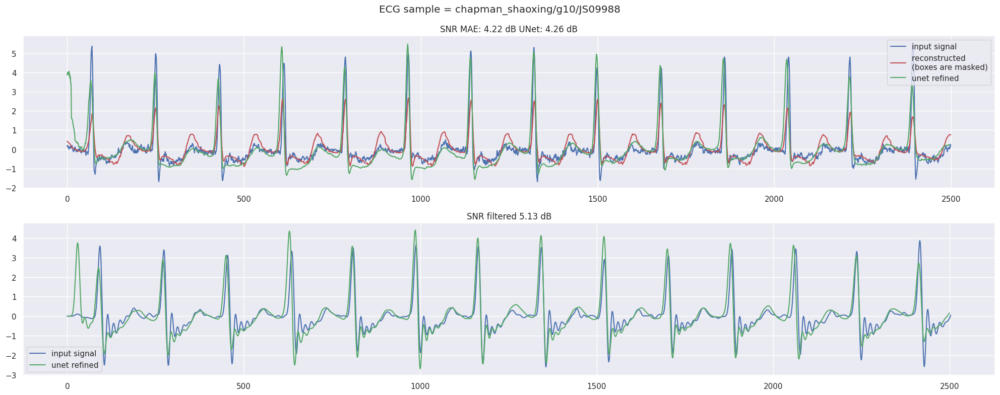

In [21]:
print(ensemble_fn(idx, st_smpl, msk_ratio=0.75, core_chnl=1, target_chnl=1, pltt=True))

(3.8996827593246723, 4.327129889791076, 1, 1, array([13,  6, 20,  1,  7, 23, 16,  9,  8, 15, 18, 22, 14, 17,  3, 24, 10,
       11, 21,  4,  0,  5, 12, 19,  2]), array([20,  3, 24, 14, 19, 21,  1,  4,  8,  7, 16, 17, 22,  0, 12,  9,  6,
       13, 10, 23,  2, 18, 11,  5, 15]), array([13,  6, 20,  1,  7, 23]))


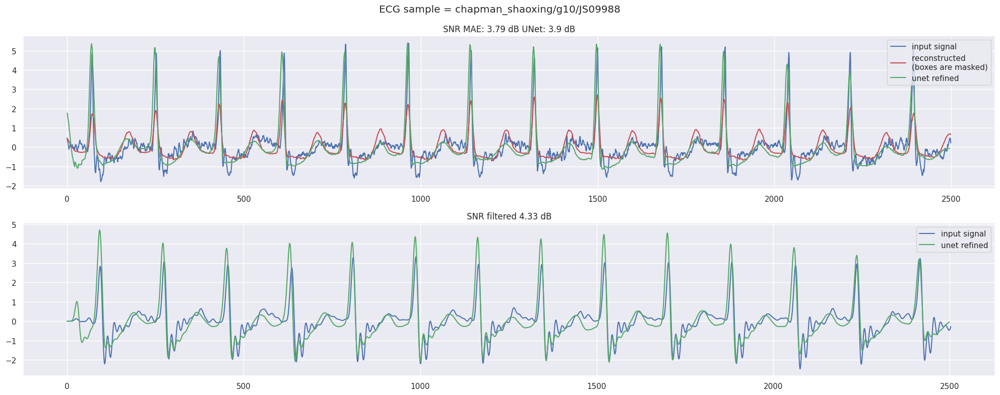

In [22]:
print(ensemble_fn(idx, st_smpl, msk_ratio=0.75, core_chnl=1, target_chnl=2, pltt=True))

In [87]:
len(dataset_ecg)

87663

In [66]:
plt.close()

In [76]:
st_smpl = 1000

for idx in np.random.randint(0,88000,10):

    for msk_ratio in [0.25,0.5,0.75]:
        print(idx,msk_ratio,ensemble_fn(idx, st_smpl, msk_ratio, core_chnl=2, target_chnl=1, pltt=False))


13459 0.25 (-2.144510908177164, -1.718490735111606, 0, 0)
13459 0.5 (-1.7242016592886125, -1.2735486540208978, 0, 0)
13459 0.75 (0.734831199083686, 1.140900990264484, 0, 0)
48117 0.25 (-0.3702623347071442, -0.7742155044432373, 1, 0)
48117 0.5 (-0.12433887083247314, -0.41167965089229386, 1, 0)
48117 0.75 (1.2540841922707808, 1.1155453140444411, 1, 0)
62111 0.25 (3.7195464850185243, 4.507223449713144, 1, 0)
62111 0.5 (4.255778389468272, 5.181118272994056, 1, 1)
62111 0.75 (2.7584302093145463, 3.483669909971775, 1, 1)
84541 0.25 (-4.933833391996169, -4.912690057971697, 0, 0)
84541 0.5 (-3.2819928341558082, -3.173323669879517, 0, 0)
84541 0.75 (-0.9918288820407464, -0.8453856894824303, 0, 0)
257 0.25 (0.8824810495150766, 1.0346387628405405, 1, 0)
257 0.5 (0.35016414629791653, 0.5037756163428831, 1, 0)
257 0.75 (1.8082290759582431, 2.3076173451872246, 1, 0)
48619 0.25 (2.4342359690435695, 2.6494538138570527, 1, 1)
48619 0.5 (3.0372252983929053, 3.381940152611139, 1, 1)
48619 0.75 (3.2361408

NameError: name 'qc' is not defined

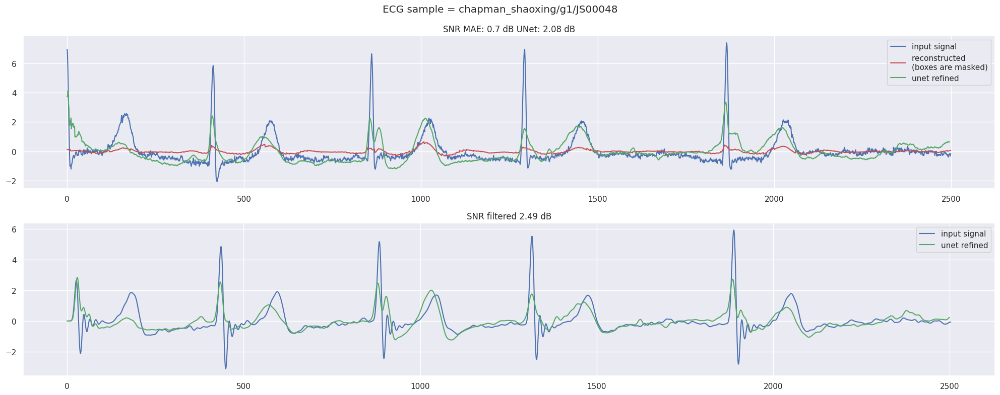

In [13]:
ensemble_fn(44  , 1000, 0.75, core_chnl=2, target_chnl=2, pltt=True)

## Quality assesment

In [28]:
! git clone https://github.com/Aura-healthcare/ecg_qc.git


Cloning into 'ecg_qc'...
remote: Enumerating objects: 876, done.
remote: Counting objects: 100% (82/82), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 876 (delta 55), reused 54 (delta 54), pack-reused 794
Receiving objects: 100% (876/876), 51.43 MiB | 28.40 MiB/s, done.
Resolving deltas: 100% (461/461), done.
python: can't open file '/home/nabil/ecg_repr/setup.py': [Errno 2] No such file or directory


In [14]:
from ecg_qc.ecg_qc import EcgQc

In [8]:
dir(ecg_qc.ecg_qc)

['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__']

In [15]:
qc = EcgQc('rfc_norm_2s.pkl',
               sampling_frequency=500,
               normalized=True)

/home/nabil/ecg_repr/ecg_repr/lib/python3.9/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator DecisionTreeClassifier from version 0.24.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/nabil/ecg_repr/ecg_repr/lib/python3.9/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator RandomForestClassifier from version 0.24.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/nabil/ecg_repr/ecg_repr/lib/python3.9/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator GridSearchCV from version 0.24.2 when using version 1.2.2. This might

In [17]:
signal_quality = qc.get_signal_quality(pred_refine_ensmeble)


In [20]:
qc.get_signal_quality(pred_refine_ensmeble)

0

In [ ]:
mdl_bnk.propose_masking

ids_shuffle, ids_restore, ids_keep = mae_mdl_bnk.propose_masking(batch_size, mae_mdl_bnk.num_patches, mask_ratio=args.mask_ratio)

### individual prediction

In [4]:
len(data_loader_train)

5478

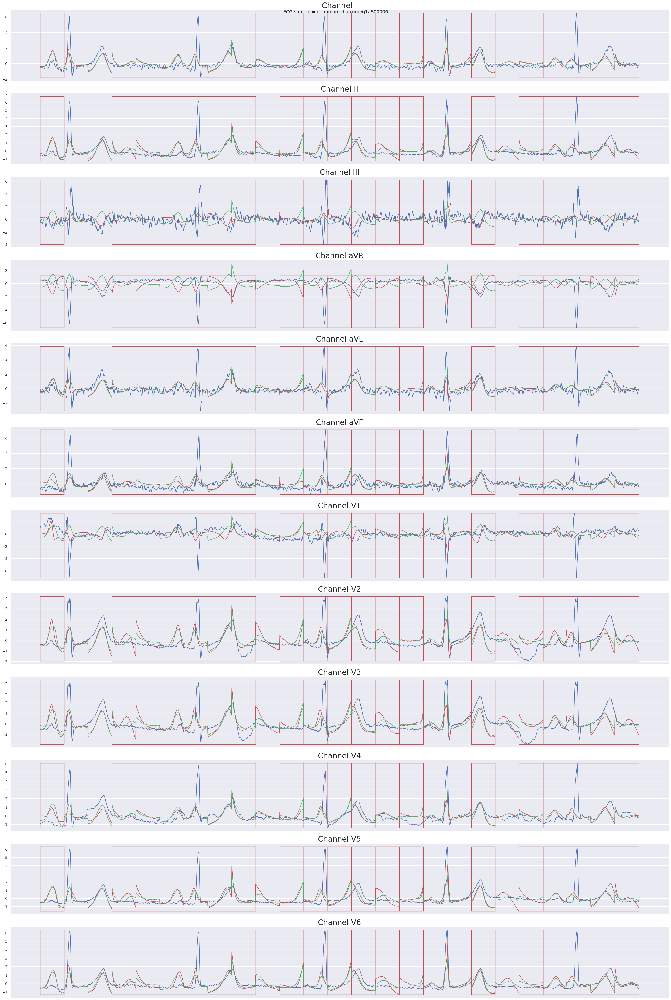

In [30]:
#idx = 66778
idx = 4001
idx = 40
idx = 4
st_smpl = 100
msk_ratio = 0.75

sig= dataset_ecg.__getitem__(idx, -1, st_smpl)
ids_shuffle, ids_restore, ids_keep = mdl_bnk.propose_masking(1, mdl_bnk.num_patches, msk_ratio)

latents = []
masks = []
preds = []
preds1 = []

core_chnl = 10

#plt.figure(figsize=(20, 15), dpi=100)
plt.figure(figsize=(30, 45), dpi=100)

x = torch.unsqueeze(torch.Tensor(sig[core_chnl:core_chnl+1,:]), dim=0)
#x = torch.unsqueeze(torch.Tensor(sig[1:2,:]), dim=0)
#x = torch.unsqueeze(torch.Tensor(sig[3:4,:]), dim=0)
#x = torch.unsqueeze(torch.Tensor(sig[4:5,:]), dim=0)
latent1, mask = mdl_bnk.maes[core_chnl].forward_encoder(x, msk_ratio, ids_shuffle, ids_restore, ids_keep)

for i in range(1, 13):
    plt.subplot(12, 1, i)
    if True:
        
        x = torch.unsqueeze(torch.Tensor(sig[(i-1):i,:]), dim=0)
        
        with torch.no_grad():

            latent, mask = mdl_bnk.maes[i-1].forward_encoder(x, msk_ratio, ids_shuffle, ids_restore, ids_keep)
            pred = mdl_bnk.maes[i-1].forward_decoder(latent, ids_restore)
            
            pred1 = mdl_bnk.maes[0].forward_decoder(latent1, ids_restore)
            
            pred = mdl_bnk.maes[i-1].unpatchify(pred).numpy()
            
            pred1 = mdl_bnk.maes[0].unpatchify(pred1).numpy()
            
            mask = torch.squeeze(mask).numpy()

            latents.append(latent)
            masks.append(mask)
            preds.append(pred)
            preds1.append(pred1)

            

        plt.plot(sig[(i-1):i,:].ravel(), label="input signal", c='b')
        #plt.plot(gt.ravel(), label="ground truth", c='b')
        plt.plot(pred.ravel(), label="reconstructed \n(boxes are masked)", c='r')
        plt.plot(pred1.ravel(), label="channel 1 embedding", c='g')
        ax = plt.gca()
        for i2 in range(len(mask)):
            if mask[i2] == 1:
                rect = patches.Rectangle(
                    (i2 * mdl_bnk.maes[i-1].window_len, min(np.min(pred), torch.min(x).item())),
                    mdl_bnk.maes[i-1].window_len,
                    max(np.max(pred), torch.max(x).item()) - min(np.min(pred), torch.min(x).item()),
                    linewidth=1,
                    edgecolor="r",
                    facecolor="none",
                )
                ax.add_patch(rect)
        # plt.legend(loc=(1.00, 0.5))
        ax.set_xticks([])
        plt.title(f'Channel {CHANNEL_NAMES[i]}', fontsize=24)

    plt.suptitle(f'ECG sample = {dataset_ecg.ecg_data[idx][71:]}')

        
plt.tight_layout()

In [75]:
list(range(0,100+1,100))

[0, 100]

In [31]:
#idx = 66778
idx = 4001
idx = 40
idx = 4
st_smpl = 100
msk_ratio = 0.75

latents = []
masks = []
preds = [ [] for i in range(12)]
preds1 = [ [] for i in range(12)]

two_side_offset = 100
offset_step = 5
core_chnl = 0

for st_ofset in tqdm(range(0,two_side_offset+1,offset_step)):
    sig = dataset_ecg.__getitem__(idx, -1, st_smpl+st_ofset)
    ids_shuffle, ids_restore, ids_keep = mdl_bnk.propose_masking(1, mdl_bnk.num_patches, msk_ratio)

    x = torch.unsqueeze(torch.Tensor(sig[core_chnl:core_chnl+1,:]), dim=0)
    latent1, mask = mdl_bnk.maes[core_chnl].forward_encoder(x, msk_ratio, ids_shuffle, ids_restore, ids_keep)

    for i in range(1, 13):
        x = torch.unsqueeze(torch.Tensor(sig[(i-1):i,:]), dim=0)
        
        with torch.no_grad():

            latent, mask = mdl_bnk.maes[i-1].forward_encoder(x, msk_ratio, ids_shuffle, ids_restore, ids_keep)
            pred = mdl_bnk.maes[i-1].forward_decoder(latent, ids_restore)                
            pred1 = mdl_bnk.maes[0].forward_decoder(latent1, ids_restore)
            
            pred = mdl_bnk.maes[i-1].unpatchify(pred).numpy()                
            pred1 = mdl_bnk.maes[0].unpatchify(pred1).numpy()

            pred = pred[:,:,two_side_offset-st_ofset:-two_side_offset-st_ofset].ravel()
            pred1 = pred1[:,:,two_side_offset-st_ofset:-two_side_offset-st_ofset].ravel()
            
            mask = torch.squeeze(mask).numpy()

            latents.append(latent)
            masks.append(mask)
            preds[i-1].append(pred)
            preds1[i-1].append(pred1)

preds = np.array(preds)
preds1 = np.array(preds1)

"""
plt.figure(figsize=(30, 45), dpi=100)


plt.plot(sig[(i-1):i,:].ravel(), label="input signal", c='b')
#plt.plot(gt.ravel(), label="ground truth", c='b')
plt.plot(pred.ravel(), label="reconstructed \n(boxes are masked)", c='r')
plt.plot(pred1.ravel(), label="channel 1 embedding", c='g')
ax = plt.gca()
for i2 in range(len(mask)):
    if mask[i2] == 1:
        rect = patches.Rectangle(
            (i2 * mdl_bnk.maes[i-1].window_len, min(np.min(pred), torch.min(x).item())),
            mdl_bnk.maes[i-1].window_len,
            max(np.max(pred), torch.max(x).item()) - min(np.min(pred), torch.min(x).item()),
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        ax.add_patch(rect)
# plt.legend(loc=(1.00, 0.5))
ax.set_xticks([])
plt.title(f'Channel {CHANNEL_NAMES[i]}', fontsize=24)

plt.suptitle(f'ECG sample = {dataset_ecg.ecg_data[idx][71:]}')


plt.tight_layout()
"""

100%|██████████| 21/21 [00:09<00:00,  2.11it/s]


'\nplt.figure(figsize=(30, 45), dpi=100)\n\n\nplt.plot(sig[(i-1):i,:].ravel(), label="input signal", c=\'b\')\n#plt.plot(gt.ravel(), label="ground truth", c=\'b\')\nplt.plot(pred.ravel(), label="reconstructed \n(boxes are masked)", c=\'r\')\nplt.plot(pred1.ravel(), label="channel 1 embedding", c=\'g\')\nax = plt.gca()\nfor i2 in range(len(mask)):\n    if mask[i2] == 1:\n        rect = patches.Rectangle(\n            (i2 * mdl_bnk.maes[i-1].window_len, min(np.min(pred), torch.min(x).item())),\n            mdl_bnk.maes[i-1].window_len,\n            max(np.max(pred), torch.max(x).item()) - min(np.min(pred), torch.min(x).item()),\n            linewidth=1,\n            edgecolor="r",\n            facecolor="none",\n        )\n        ax.add_patch(rect)\n# plt.legend(loc=(1.00, 0.5))\nax.set_xticks([])\nplt.title(f\'Channel {CHANNEL_NAMES[i]}\', fontsize=24)\n\nplt.suptitle(f\'ECG sample = {dataset_ecg.ecg_data[idx][71:]}\')\n\n\nplt.tight_layout()\n'

In [ ]:
plt.figure(figsize=(30, 45), dpi=100)


for i in range(12):
    plt.subplot(12, 1, i+1)
    
    plt.plot(preds[i,0],c='r')
    plt.plot(preds1[i,0],c='g')

    for j in range(preds.shape[1]):
        break
        plt.plot(preds[i,j],c='r')
        plt.plot(preds1[i,j],c='g')


    plt.plot(sig[i,:-2*two_side_offset],c='b')
    plt.title(f'Channel {CHANNEL_NAMES[i+1]}', fontsize=24)
    ax.set_xticks([])




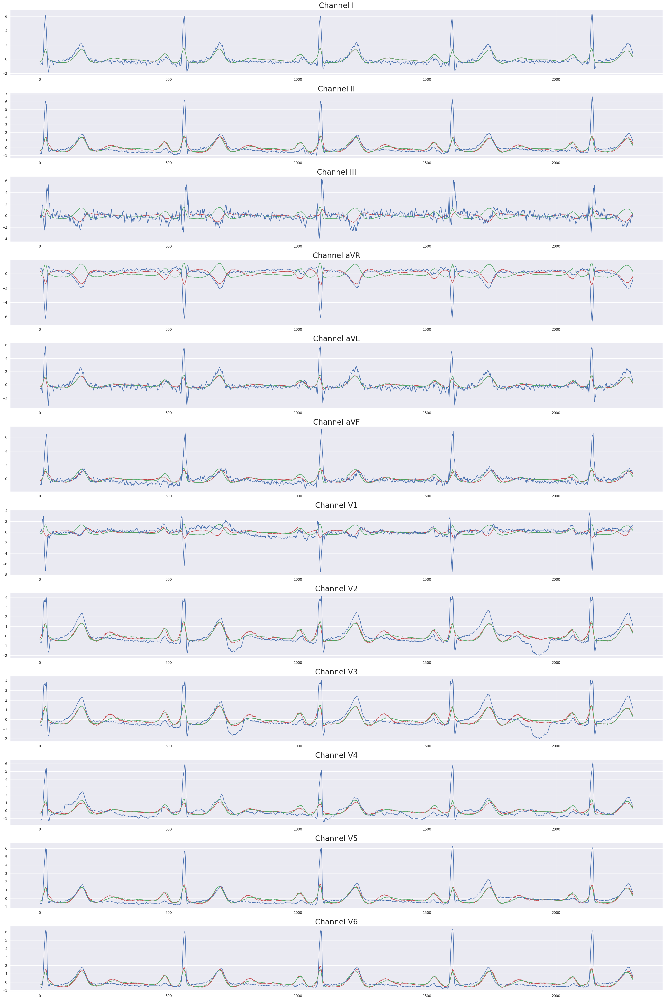

In [32]:
plt.figure(figsize=(30, 45), dpi=100)
#plt.figure(figsize=(30, 15), dpi=100)


for i in range(12):
    plt.subplot(12, 1, i+1)
    
    plt.plot(np.mean(preds[i],axis=0),c='r')
    plt.plot(np.mean(preds1[i],axis=0),c='g')

    #plt.plot(preds[i,0],c='r')
    #plt.plot(preds1[i,0],c='g')

    for j in range(preds.shape[1]):
        break
        plt.plot(preds[i,j],c='r')
        plt.plot(preds1[i,j],c='g')


    plt.plot(sig[i,:-2*two_side_offset],c='b')
    plt.title(f'Channel {CHANNEL_NAMES[i+1]}', fontsize=24)
    ax.set_xticks([])

plt.tight_layout()


In [59]:
sig.shape

(12, 2500)

In [20]:
torch.min(x).item()

-2.374696969985962

In [66]:
latents2.shape,latent.shape

(torch.Size([1, 7, 1024]), torch.Size([1, 7, 1024]))

In [67]:
torch.cosine_similarity(latent,latents2)

tensor([[1.0000, 1.0000, 0.9996,  ..., 1.0000, 1.0000, 1.0000]])

In [63]:
torch.cosine_similarity(latents[10][0],latents[10][0])

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])

### universal prediction

In [57]:
latents2 = latent[:]

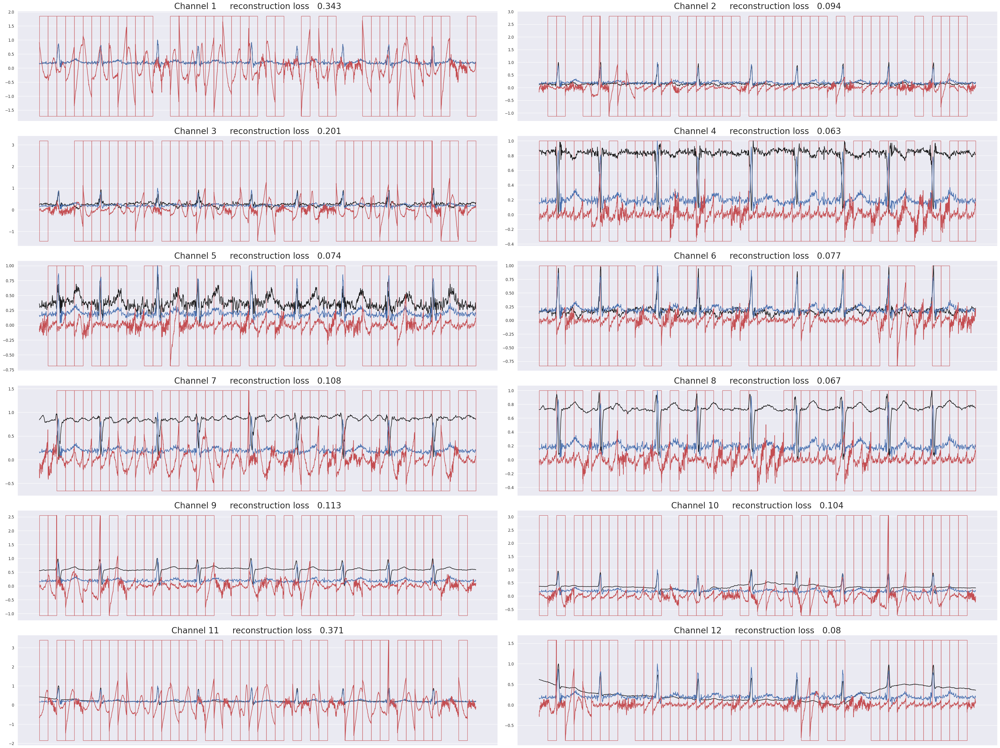

In [26]:
idx = 56
chnl = 10
st_smpl = 100

plt.figure(figsize=(40, 30), dpi=100)

for chnl in range(1, 13):
    plt.subplot(6, 2, chnl)
    if True:
        sig, gt = dataset_ecg.__getitem__(idx, chnl, st_smpl)
        x = torch.unsqueeze(torch.Tensor(sig), dim=0)
        y = torch.unsqueeze(torch.Tensor(gt), dim=0)

        with torch.no_grad():
            loss, out, masks = mdl1(x, y, mask_ratio=0.75)
            loss = loss.item()
            out = mdl1.unpatchify(out).numpy()
            masks = torch.squeeze(masks).numpy()

        plt.plot(sig.ravel(), label="input signal", c='k')
        plt.plot(gt.ravel(), label="ground truth", c='b')
        plt.plot(out.ravel(), label="reconstructed \n(boxes are masked)", c='r')
        ax = plt.gca()
        for i2 in range(len(masks)):
            if masks[i2] == 1:
                rect = patches.Rectangle(
                    (i2 * window_len, min(np.min(out), np.min(sig))),
                    window_len,
                    max(np.max(out), np.max(sig)) - min(np.min(out), np.min(sig)),
                    linewidth=1,
                    edgecolor="r",
                    facecolor="none",
                )
                ax.add_patch(rect)
        # plt.legend(loc=(1.00, 0.5))
        ax.set_xticks([])
        # plt.xlabel(f'ECG sample = {dataset_ecg.ecg_data[idx][71:]}')
        plt.title(
            f"Channel {chnl}     reconstruction loss   {np.round(loss,3)}", fontsize=24
        )
plt.tight_layout()

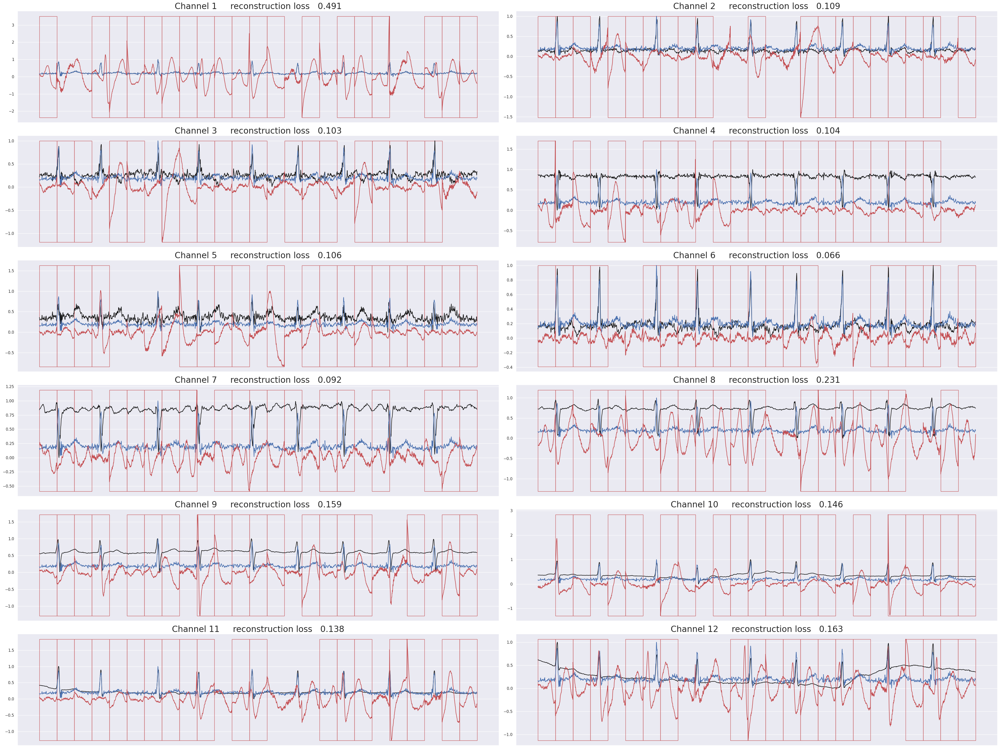

In [20]:
idx = 56
chnl = 10
st_smpl = 100

plt.figure(figsize=(40, 30), dpi=100)

for chnl in range(1, 13):
    plt.subplot(6, 2, chnl)
    if True:
        sig, gt = dataset_ecg.__getitem__(idx, chnl, st_smpl)
        x = torch.unsqueeze(torch.Tensor(sig), dim=0)
        y = torch.unsqueeze(torch.Tensor(gt), dim=0)

        with torch.no_grad():
            loss, out, masks = mdl1(x, y, mask_ratio=0.75)
            loss = loss.item()
            out = mdl1.unpatchify(out).numpy()
            masks = torch.squeeze(masks).numpy()

        plt.plot(sig.ravel(), label="input signal", c='k')
        plt.plot(gt.ravel(), label="ground truth", c='b')
        plt.plot(out.ravel(), label="reconstructed \n(boxes are masked)", c='r')
        ax = plt.gca()
        for i2 in range(len(masks)):
            if masks[i2] == 1:
                rect = patches.Rectangle(
                    (i2 * window_len, min(np.min(out), np.min(sig))),
                    window_len,
                    max(np.max(out), np.max(sig)) - min(np.min(out), np.min(sig)),
                    linewidth=1,
                    edgecolor="r",
                    facecolor="none",
                )
                ax.add_patch(rect)
        # plt.legend(loc=(1.00, 0.5))
        ax.set_xticks([])
        # plt.xlabel(f'ECG sample = {dataset_ecg.ecg_data[idx][71:]}')
        plt.title(
            f"Channel {chnl}     reconstruction loss   {np.round(loss,3)}", fontsize=24
        )
plt.tight_layout()

In [ ]:
idx = 126
chnl = 10
st_smpl = 100

plt.figure(figsize=(40, 30), dpi=100)

for chnl in range(1, 13):
    plt.subplot(6, 2, chnl)
    if True:
        sig = dataset_ecg.__getitem__(idx, chnl, st_smpl, maxmin_norma=False)
        x = torch.unsqueeze(torch.Tensor(sig), dim=0)

        with torch.no_grad():
            loss, out, masks = mdl1(x, mask_ratio=0.5)
            loss = loss.item()
            out = mdl1.unpatchify(out).numpy()
            masks = torch.squeeze(masks).numpy()

        plt.plot(sig.ravel(), label="ground truth")
        plt.plot(out.ravel(), label="reconstructed \n(boxes are masked)")
        ax = plt.gca()
        for i2 in range(len(masks)):
            if masks[i2] == 1:
                rect = patches.Rectangle(
                    (i2 * window_len, min(np.min(out), np.min(sig))),
                    window_len,
                    max(np.max(out), np.max(sig)) - min(np.min(out), np.min(sig)),
                    linewidth=1,
                    edgecolor="r",
                    facecolor="none",
                )
                ax.add_patch(rect)
        # plt.legend(loc=(1.00, 0.5))
        ax.set_xticks([])
        # plt.xlabel(f'ECG sample = {dataset_ecg.ecg_data[idx][71:]}')
        plt.title(
            f"Channel {chnl}     reconstruction loss   {np.round(loss,3)}", fontsize=24
        )
plt.tight_layout()

In [ ]:
plt.figure(figsize=(20, 7.5), dpi=100)
plt.subplot(3, 1, 1)
plt.plot(sig.ravel())
plt.subplot(3, 1, 2)
plt.plot(out.ravel())
ax = plt.gca()
ax.set_xticks([])
plt.xlabel("reconstructed")
plt.subplot(3, 1, 3)
plt.plot(sig.ravel(), label="ground truth")
plt.plot(out.ravel(), label="reconstructed \n(boxes are masked)")
ax = plt.gca()
for i2 in range(len(masks)):
    if masks[i2] == 1:
        rect = patches.Rectangle(
            (i2 * window_len, min(np.min(out), np.min(sig))),
            window_len,
            max(np.max(out), np.max(sig)) - min(np.min(out), np.min(sig)),
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        ax.add_patch(rect)
plt.legend(loc=(1.00, 0.5))
ax.set_xticks([])
plt.xlabel("Comparison")
plt.suptitle(f"reconstruction loss   {np.round(loss,3)}")
plt.tight_layout()

In [ ]:
out = out.ravel()

In [ ]:
plt.figure(figsize=(15, 5))
for i in range(6, 16):
    plt.subplot(1, 10, i - 5)
    if (i - 5) in [2, 3, 7, 9]:
        plt.plot(out[i * 100 : (i + 1) * 100], c="orange")
    else:
        plt.plot(sig[i * 100 : (i + 1) * 100])
    plt.ylim([-4, 4])
    ax = plt.gca()
    ax.set_xticks([])
    ax.set_yticks([])
    # plt.axis("off")

In [ ]:
/home/nabil/ecg_repr/experiments/exp7

In [ ]:
exp_lbl = {
    "exp2": " only channel 1",
    "exp3": " 12 channels randomly",
    "exp4": " 12 channels randomly, 50% masks",
    "exp5": " 12 channels randomly, 90% masks",
    "exp6": " 12 channels randomly, more decoder blocks(6)",
    "exp7": " 12 channels randomly, higher embed-dim (2048)",
    "exp8 large signal, all 12 channel, norm_pix_loss": "all 12 channels present in every minibatch",
}

losses = {}


for dirr in [
    "exp2",
    "exp3",
    "exp4",
    "exp5",
    "exp6",
    "exp7",
    "exp8 large signal, all 12 channel, norm_pix_loss",
]:
    fp = open(f"experiments/{dirr}/log.txt", "r")
    dt = fp.read().split("\n")[:-1]
    fp.close()

    losses[dirr] = []

    for i in range(len(dt)):
        losses[dirr].append(float(dt[i].split(",")[1].split('"train_loss": ')[-1]))

In [ ]:
plt.figure(figsize=(10, 5))

for exp_nm in losses:
    plt.plot(losses[exp_nm], label=exp_lbl[exp_nm])

#
# plt.plot(losses['dir7'],label='2D model')
plt.legend()
plt.title("MAE loss")
plt.xlabel("Epoch")

In [ ]:
losses = {}


for dirr in ["dir2", "dir3", "dir4", "dir6", "dir7", "dir63"]:
    fp = open(f"output_{dirr}/log.txt", "r")
    dt = fp.read().split("\n")[:-1]
    fp.close()

    losses[dirr] = []

    for i in range(len(dt)):
        losses[dirr].append(float(dt[i].split(",")[1].split('"train_loss": ')[-1]))

In [ ]:
plt.plot(losses["dir2"], label="long signal, shallow model")
plt.plot(losses["dir6"], label="short signal, shallow model")
plt.plot(losses["dir63"], label="short signal, deep model,\nwith norm pix loss")
#
# plt.plot(losses['dir7'],label='2D model')
plt.legend()
plt.title("MAE loss")
plt.xlabel("Epoch")

In [ ]:
len(losses["dir2"])

## Shorter signal model

In [ ]:
window_len = 25
sig_len = 1500

mdl2 = MaskedAutoencoderViT1D(
    sig_len=1500,
    window_len=25,
    in_chans=1,
    embed_dim=1024,
    depth=16,
    num_heads=8,
    decoder_embed_dim=512,
    decoder_depth=4,
    decoder_num_heads=16,
    mlp_ratio=4.0,
    norm_layer=nn.LayerNorm,
    norm_pix_loss=False,
)

In [ ]:
mdl2.load_state_dict(
    torch.load("output_dir63/checkpoint-499.pth", map_location="cpu")["model"]
)

In [ ]:
dataset_ecg = ECGPretrainDataset(
    "/data/nabil/ecg_repr/physionet.org/files/challenge-2021/1.0.3/training/",
    1500,
    mode="1D",
)

In [ ]:
dataset_ecg.__getitem__(0)

In [ ]:
25601
33698
178

In [ ]:
idx = 34
sig = dataset_ecg.__getitem__(idx)
x = torch.unsqueeze(torch.Tensor(sig), dim=0)


with torch.no_grad():
    loss, out, masks = mdl2(x)
    loss = loss.item()
    out = mdl2.unpatchify(out).numpy()
    masks = torch.squeeze(masks).numpy()


plt.figure(figsize=(20, 5), dpi=100)
plt.plot(sig.ravel(), label="ground truth")
plt.plot(out.ravel(), label="reconstructed \n(boxes are masked)")
ax = plt.gca()
for i2 in range(len(masks)):
    if masks[i2] == 1:
        rect = patches.Rectangle(
            (i2 * window_len, min(np.min(out), np.min(sig))),
            window_len,
            max(np.max(out), np.max(sig)) - min(np.min(out), np.min(sig)),
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        ax.add_patch(rect)
plt.legend(loc=(1.00, 0.5))
ax.set_xticks([])
plt.xlabel(f"ECG sample = {dataset_ecg.ecg_data[idx][71:]}")
plt.suptitle(f"reconstruction loss   {np.round(loss,3)}")
plt.tight_layout()

In [ ]:
mdl2.patch_embed.proj.weight

In [ ]:
mdl2.blocks[0].attn.qkv.weight

In [ ]:
plt.figure(figsize=(20, 7.5), dpi=100)
plt.subplot(3, 1, 1)
plt.plot(sig.ravel())
plt.subplot(3, 1, 2)
plt.plot(out.ravel())
ax = plt.gca()
ax.set_xticks([])
plt.xlabel("reconstructed")
plt.subplot(3, 1, 3)
plt.plot(sig.ravel(), label="ground truth")
plt.plot(out.ravel(), label="reconstructed \n(boxes are masked)")
ax = plt.gca()
for i2 in range(len(masks)):
    if masks[i2] == 1:
        rect = patches.Rectangle(
            (i2 * window_len, min(np.min(out), np.min(sig))),
            window_len,
            max(np.max(out), np.max(sig)) - min(np.min(out), np.min(sig)),
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        ax.add_patch(rect)
plt.legend(loc=(1.00, 0.5))
ax.set_xticks([])
plt.xlabel("Comparison")
plt.suptitle(f"reconstruction loss   {np.round(loss,3)}")
plt.tight_layout()

In [ ]:
out = out.ravel()

In [ ]:
plt.figure(figsize=(15, 5))
for i in range(6, 16):
    plt.subplot(1, 10, i - 5)
    if (i - 5) in [2, 3, 7, 9]:
        plt.plot(out[i * 100 : (i + 1) * 100], c="orange")
    else:
        plt.plot(sig[i * 100 : (i + 1) * 100])
    plt.ylim([-4, 4])
    ax = plt.gca()
    ax.set_xticks([])
    ax.set_yticks([])
    # plt.axis("off")

In [ ]:
losses = {}


for dirr in ["dir2", "dir3", "dir4", "dir5"]:
    fp = open(f"output_{dirr}/log.txt", "r")
    dt = fp.read().split("\n")[:-1]
    fp.close()

    losses[dirr] = []

    for i in range(len(dt)):
        losses[dirr].append(float(dt[i].split(",")[1].split('"train_loss": ')[-1]))

In [ ]:
plt.plot(losses["dir2"], label="long signal, shallow model")
plt.plot(losses["dir3"], label="long signal, deep model")
plt.plot(losses["dir5"], label="short signal, shallow model")
plt.legend()
plt.title("MAE loss")
plt.xlabel("Epoch")

In [ ]:
len(losses["dir2"])

In [ ]:
import pickle

In [ ]:
samples, loss, pred, msks = pickle.load(open("reasonfornan.p", "rb"))

In [ ]:
pred.shape, samples.shape, msks.shape

In [ ]:
ptchs = mdl2.patchify(samples)

In [ ]:
ptchs.shape

In [ ]:
(pred.isnan() * 1.0).nonzero()

In [ ]:
pred[160]